First lets clean the ghibili dataset ...

In [1]:
%%capture
# lets convert all images into (3, 256, 256) format
# and save them in a new folder

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math

# load all images from the folder
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
    return images

images = load_images_from_folder('./data/final_trainB')

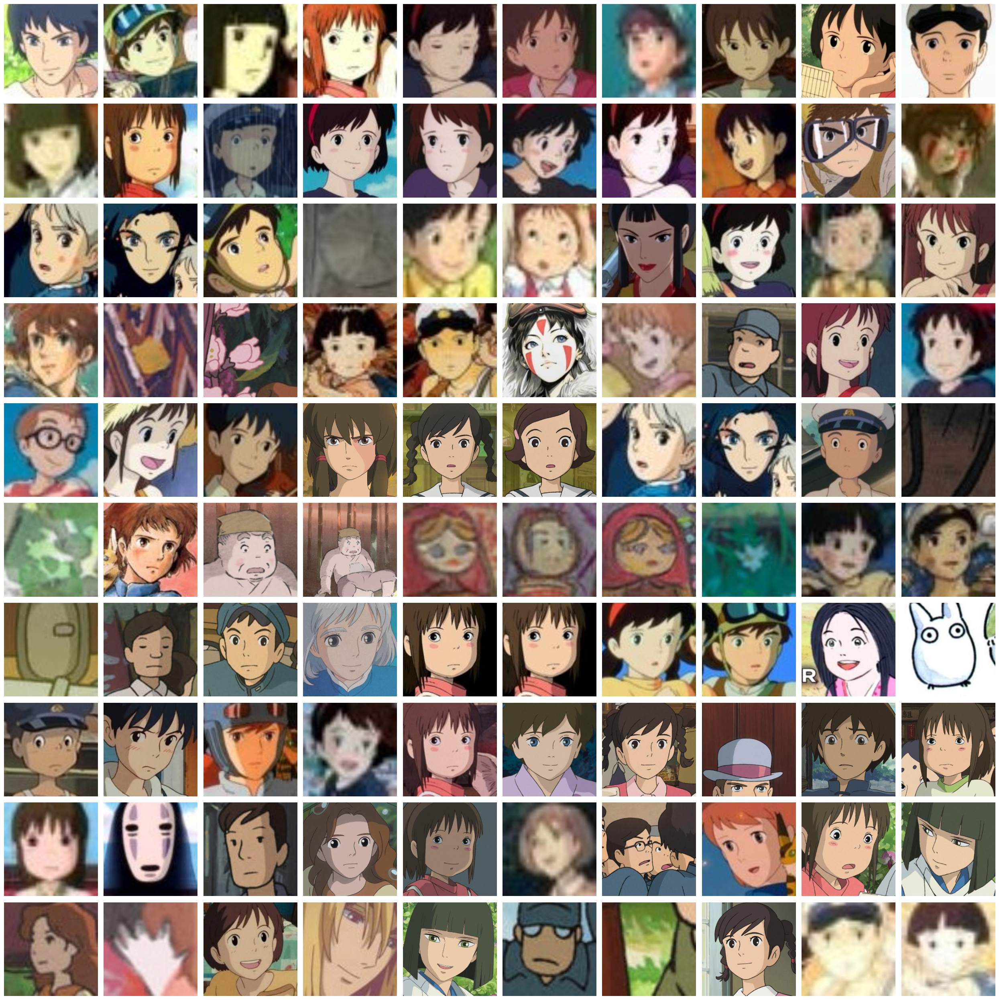

In [15]:
def convert_to_tensor(image):
    image = cv2.resize(image, (256, 256))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR → RGB
    image = np.transpose(image, (2, 0, 1))  # CHW
    image = image / 255.0
    return image

def display_images(images, cols=3):
    num_images = len(images)
    rows = math.ceil(num_images / cols)

    plt.figure(figsize=(cols * 2.5, rows * 2.5))

    for i in range(num_images):
        image = images[i]
        image = np.transpose(image, (1, 2, 0))  # CHW → HWC

        plt.subplot(rows, cols, i + 1)
        plt.imshow(image)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
tensor_images = [convert_to_tensor(np.array(img)) for img in images[:100]]
display_images(tensor_images, cols=10)


Detect outliers using an autoencoder ...

Epoch 1 Loss: 0.085545
Epoch 2 Loss: 0.073431
Epoch 3 Loss: 0.071402
Epoch 4 Loss: 0.072105
Epoch 5 Loss: 0.066448
Epoch 6 Loss: 0.061493
Epoch 7 Loss: 0.062182
Epoch 8 Loss: 0.061368
Epoch 9 Loss: 0.057845
Epoch 10 Loss: 0.055340
Number of outliers: 5


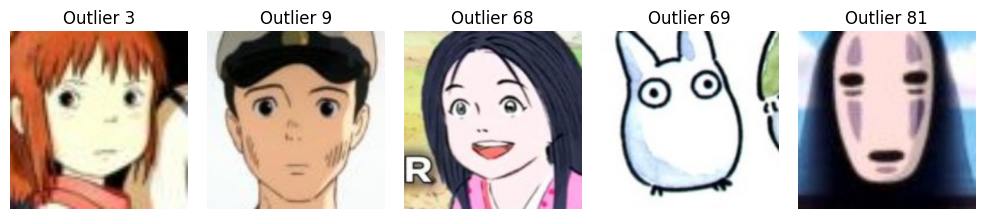

In [17]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# ----------------------------
# Step 1: Prepare the image tensors
# ----------------------------
# Assuming `tensor_images` is a list of normalized CHW tensors
X = torch.tensor(np.stack(tensor_images)).float()  # Shape: (N, 3, 256, 256)

# ----------------------------
# Step 2: Define the Autoencoder
# ----------------------------
class Encoder(nn.Module):
    def __init__(self, encoding_dim=1024):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),   # 128x128
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # 64x64
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # 32x32
            nn.ReLU(),
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),  # 16x16
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),  # 8x8
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(512 * 8 * 8, encoding_dim)
        )

    def forward(self, x):
        return self.net(x)

class Decoder(nn.Module):
    def __init__(self, encoding_dim=1024):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(encoding_dim, 512 * 8 * 8),
            nn.ReLU(),
            nn.Unflatten(1, (512, 8, 8)),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),  # 16x16
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # 32x32
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),   # 64x64
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),    # 128x128
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),     # 256x256
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x)

class Autoencoder(nn.Module):
    def __init__(self, encoding_dim=1024):
        super().__init__()
        self.encoder = Encoder(encoding_dim)
        self.decoder = Decoder(encoding_dim)

    def forward(self, x):
        z = self.encoder(x)
        return self.decoder(z)

# ----------------------------
# Step 3: Train the Autoencoder
# ----------------------------
model = Autoencoder()
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

loader = DataLoader(TensorDataset(X), batch_size=16, shuffle=True)

model.train()
for epoch in range(10):
    total_loss = 0
    for batch in loader:
        imgs = batch[0]
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, imgs)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1} Loss: {total_loss / len(loader):.6f}")

# ----------------------------
# Step 4: Detect Outliers
# ----------------------------
model.eval()
with torch.no_grad():
    recon = model(X)
    recon_error = ((recon - X) ** 2).view(len(X), -1).mean(dim=1)

threshold = np.percentile(recon_error.numpy(), 95)  # Top 5% = outliers
outliers = recon_error > threshold
print(f"Number of outliers: {outliers.sum().item()}")

# ----------------------------
# Step 5: Visualize Outliers
# ----------------------------
outlier_idx = outliers.nonzero().squeeze().tolist()
outlier_idx = outlier_idx[:25] if isinstance(outlier_idx, list) else [outlier_idx]

plt.figure(figsize=(10, 10))
for i, idx in enumerate(outlier_idx):
    plt.subplot(5, 5, i + 1)
    img = np.transpose(X[idx].numpy(), (1, 2, 0))  # CHW -> HWC
    plt.imshow(img)
    plt.title(f"Outlier {idx}")
    plt.axis('off')
plt.tight_layout()
plt.show()


.... not much info. But at this point, most of the outliers where already removed from manual inspection...

... the same manual inspection was also done for blurry images ...

Removed 68 blurry images.


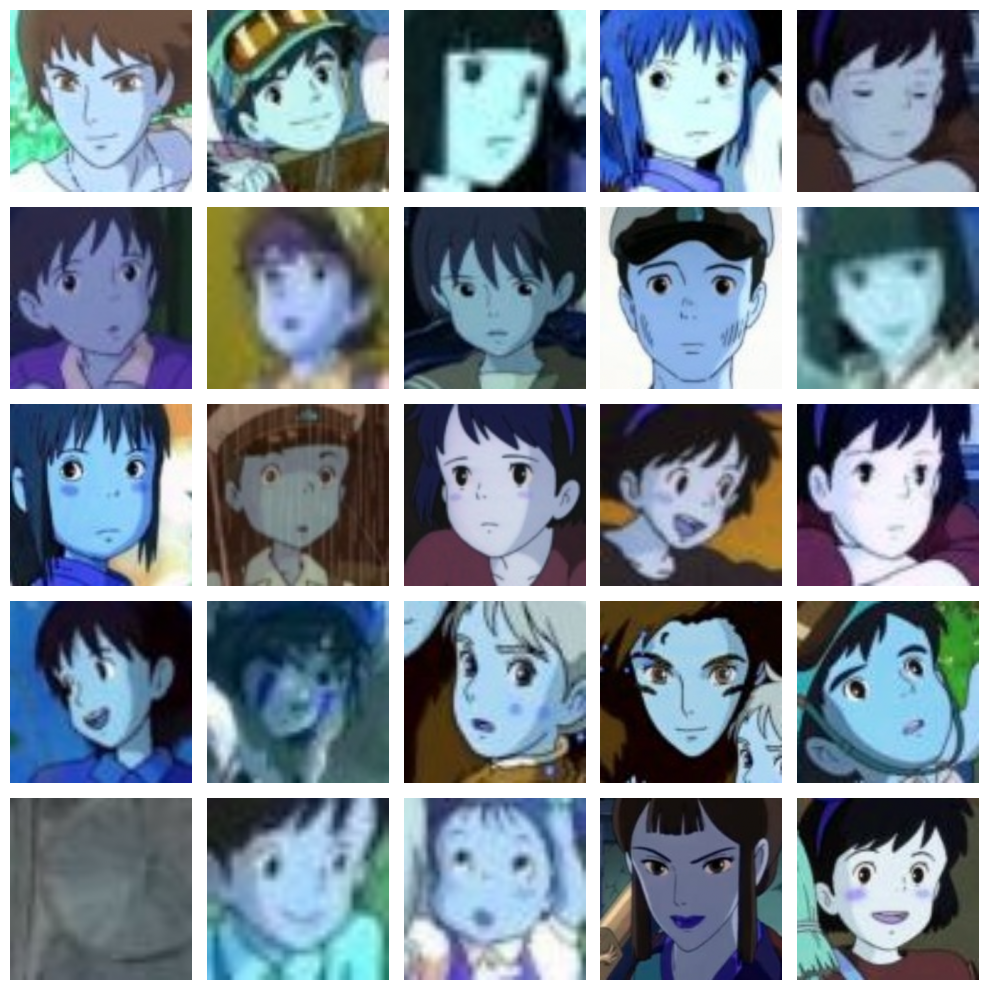

In [ ]:
import cv2
import numpy as np

def is_blurry(image, threshold=100.0):
    """Returns True if image is blurry."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
    return laplacian_var < threshold

def remove_blurry_images(images_cv2, threshold=100.0):
    """Remove blurry images from a list of OpenCV-format images."""
    sharp_images = []
    blurry_indices = []
    for idx, img in enumerate(images_cv2):
        if not is_blurry(img, threshold):
            sharp_images.append(img)
        else:
            blurry_indices.append(idx)
    return sharp_images, blurry_indices

images_cv2 = []
for img in tensor_images:
    img = np.transpose(img, (1, 2, 0))  # CHW → HWC
    img = (img * 255).astype(np.uint8)
    img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    images_cv2.append(img_bgr)

# Remove blurry ones
sharp_images, blurry_indices = remove_blurry_images(images_cv2, threshold=100.0)
print(f"Removed {len(blurry_indices)} blurry images.")

# show the first 25 images
plt.figure(figsize=(10, 10))

for i in range(25):
    plt.subplot(5, 5, i + 1)
    # img = np.transpose(sharp_images[i], (2, 0, 1))  # HWC → CHW
    # img = img / 255.0
    plt.imshow(images_cv2[blurry_indices[i]])
    plt.axis('off')
plt.tight_layout()
plt.show()
